# Groupe 3 - Projet Santé 

OUKACI Mathilde, DROGUET Mathilde, LE MASNE Armel, VELLARD Antonin, ROBIN Ninon
Dataset: http://medicaldecathlon.com/

### Imports and installs

In [17]:
pip install nibabel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [18]:
pip install celluloid

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [19]:
pip install torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [20]:
pip install imgaug

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [21]:
pip install pytorch_lightning

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.8/825.8 KB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.2/517.2 KB 26.3 MB/s eta 0:00:00


We need to unzip the dataset

In [22]:
%matplotlib notebook
from pathlib import Path # To use paths easily
import nibabel as nib # To use NIfTI files
import numpy as np # For file loading and array operations
import matplotlib.pyplot as plt # To visualize images
from celluloid import Camera # For the volume visualization
from tqdm.notebook import tqdm # For progressing bars
import cv2 # Open CV package to resize the data
import os, gzip, shutil # For file operations

# For data augmentation
import imgaug 
import imgaug.augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

import torch # For the model

# For efficient and easy training implementation
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

In [ ]:
import zipfile
abs_file_path = '/content/gdrive/MyDrive/EFREI/S9 : Projet Santé/Task06_Lung.zip'
output_path = '/content/gdrive/MyDrive/EFREI/S9\ \:\ Projet\ Santé/Task06_Lung2'
zip_obj = zipfile.ZipFile(abs_file_path, 'r')
zip_obj.extractall(output_path)
zip_obj.close()

## Dataset inspection

We mount the google colab so we can acces the files on the drive

In [5]:
from google.colab import drive
#drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


We check if it worked

In [66]:
ls /content/gdrive/MyDrive/EFREI/Task06_Lung/

shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
Task06_Lung/


We extract all the files from the dataset (.nii.gz to .nii)

In [ ]:
dir_name = '/content/gdrive/data/Task06_Lung/imagesTr/'

def gz_extract(directory):
    extension = ".gz"
    os.chdir(directory)
    for item in os.listdir(directory): # loop through items in dir
        if item.endswith(extension): # check for ".gz" extension
            gz_name = os.path.abspath(item) # get full path of files
            file_name = (os.path.basename(gz_name)).rsplit('.',1)[0] #get file name for file within
            with gzip.open(gz_name,"rb") as f_in, open(file_name,"wb") as f_out:
                  shutil.copyfileobj(f_in, f_out)
            os.remove(gz_name) # delete zipped file
        
gz_extract(dir_name)

In [ ]:
dir_name = '/Users/mathildeoukaci/Desktop/EFREI/COURS/S9/PROJETSANTE/data/Task06_Lung/imagesTs/'

def gz_extract(directory):
    extension = ".gz"
    os.chdir(directory)
    for item in os.listdir(directory): # loop through items in dir
        if item.endswith(extension): # check for ".gz" extension
            gz_name = os.path.abspath(item) # get full path of files
            file_name = (os.path.basename(gz_name)).rsplit('.',1)[0] #get file name for file within
            with gzip.open(gz_name,"rb") as f_in, open(file_name,"wb") as f_out:
                  shutil.copyfileobj(f_in, f_out)
            os.remove(gz_name) # delete zipped file
        
gz_extract(dir_name)

In [ ]:
dir_name = '/Users/mathildeoukaci/Desktop/EFREI/COURS/S9/PROJETSANTE/data/Task06_Lung/labelsTr/'

def gz_extract(directory):
    extension = ".gz"
    os.chdir(directory)
    for item in os.listdir(directory): # loop through items in dir
        if item.endswith(extension): # check for ".gz" extension
            gz_name = os.path.abspath(item) # get full path of files
            file_name = (os.path.basename(gz_name)).rsplit('.',1)[0] #get file name for file within
            with gzip.open(gz_name,"rb") as f_in, open(file_name,"wb") as f_out:
                  shutil.copyfileobj(f_in, f_out)
            os.remove(gz_name) # delete zipped file
        
gz_extract(dir_name)

In [ ]:
# The working directory path has been changed with the gz_extract function.
# Here we set the right working directory by going back three level up in the path.
workdir = '../../..'
os.chdir(workdir)

In [9]:
pwd

'/content'

We define the paths to images and labels

In [10]:
root = Path("./data/Task06_Lung/imagesTr/")
label = Path("./data/Task06_Lung/labelsTr/")

We need to associate the imagesTr path with its corresponding labelsTr path

In [ ]:
def change_img_to_label_path(path):
    parts = list(path.parts)  # get all directories that are in the path
    parts[parts.index("imagesTr")] = "labelsTr"  # Associate imagesTr with labelsTr
    return Path(*parts) # Return the modified path

In [ ]:
sample_path = list(root.glob("lung*"))[2]  # Choose a specific subject from the root directory
sample_path_label = change_img_to_label_path(sample_path) # Get the corresponding label path for the chosen subject

In [ ]:
# Let's check if it worked
sample_path, sample_path_label

(PosixPath('data/Task06_Lung/imagesTr/lung_033.nii'),
 PosixPath('data/Task06_Lung/labelsTr/lung_033.nii'))

Now we can load the NIfTI file and extract image data

In [ ]:
# Load the data and label using the Nibabel library
data = nib.load(sample_path)
label = nib.load(sample_path_label)

# Get the raw data from the data file
ct = data.get_fdata()

# Get the raw data from the label file
mask = label.get_fdata()

And plot the figure

<IPython.core.display.Javascript object>


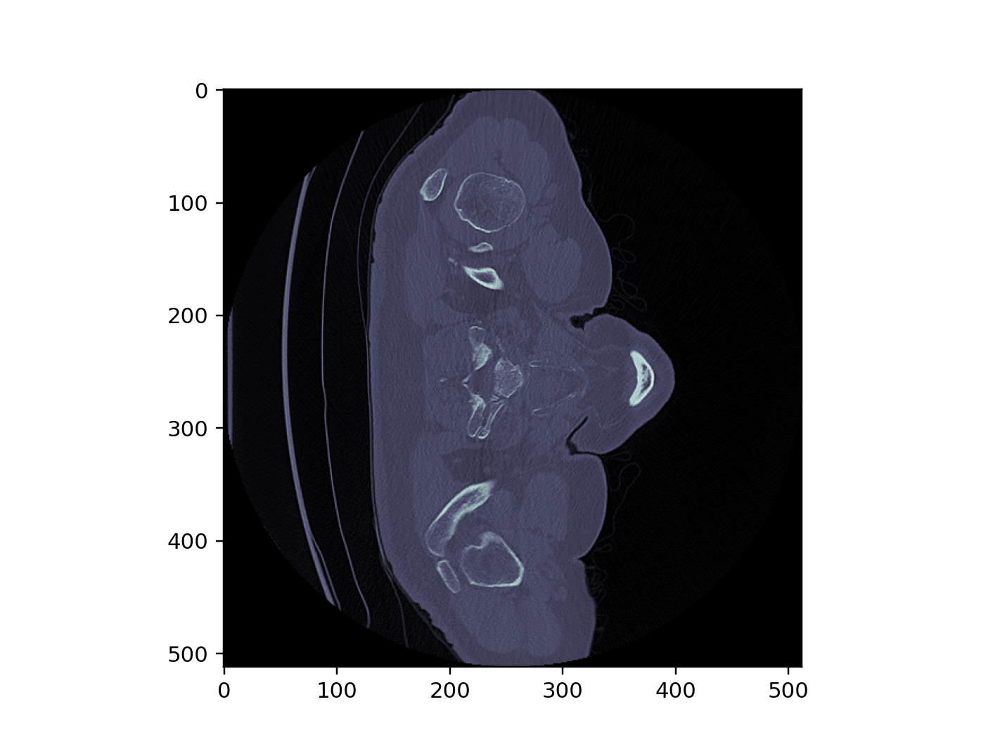

In [ ]:
fig = plt.figure() # Create a figure object using matplotlib
camera = Camera(fig)  # Create the camera object from celluloid library

# Iterate over slices of the CT data
for i in range(0, ct.shape[2], 2):  # axial view
    plt.imshow(ct[:,:,i], cmap="bone") # Display the current slice of the CT data using the "bone" colormap
    mask_ = np.ma.masked_where(mask[:,:,i]==0, mask[:,:,i])
    plt.imshow(mask_, alpha=0.5, cmap="autumn")
    #plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation


## Preprocessing 

In [78]:
all_files = list(root.glob("lung_*"))  # Get all subjects
len(all_files)

63


#### In this preprocessing part, we will:
    
    - Normalize the range of the CT images. 
    CT images have a range from -1000 to 3071 so we will normalize it by dividing by 3071.

    - Crop parts of the lower abdomen to reduce the complexity.
    We want to focus on the lung so we can crop parts of the lower abdomen.
    
    - Store the data as 2D files for faster loading.
    
    - Resize the slices and masks to (256,256)

In [ ]:
### DO NOT RE-RUN
save_root = Path("Task06_Lung/Preprocessed")  # create a Path object with the save root directory

for counter, path_to_ct_data in enumerate(tqdm(all_files)):
    # Get path to ground truth by calling change_img_to_label_path() on the path to CT data
    path_to_label = change_img_to_label_path(path_to_ct_data)  

    # Load and extract corresponding CT data and label data using nibabel library
    ct_data = nib.load(path_to_ct_data).get_fdata()
    label_data = nib.load(path_to_label).get_fdata()
    
    # Crop volume and label, removing the first 30 slices
    ct_data = ct_data[:,:,30:] / 3071
    label_data = label_data[:,:,30:]
        
    # Check if train or val data based on the counter value and create the corresponding path
    if counter < 57:
        current_path = save_root/"train"/str(counter)  # create path for training data
    else:
        current_path = save_root/"val"/str(counter)  # create path for validation data
    
    # Loop over the slices in the full volume and store the data and labels
    for i in range(ct_data.shape[-1]):
        slice = ct_data[:,:,i]  # extract the current slice
        mask = label_data[:,:,i]  # extract the corresponding label

        # Resize the slice and label to common resolution using OpenCV to reduce training time
        slice = cv2.resize(slice, (256, 256))
        mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)
        
        # Create paths for storing the slice and label
        slice_path = current_path/"data"
        mask_path = current_path/"masks"
        # Create the directories if they do not exist
        slice_path.mkdir(parents=True, exist_ok=True)
        mask_path.mkdir(parents=True, exist_ok=True)
        
        # Save the slice and label using Numpy
        np.save(slice_path/str(i), slice)
        np.save(mask_path/str(i), mask)


We can check if it worked

In [46]:
os.chdir('/content/gdrive/MyDrive/EFREI/')

In [44]:
path = Path("./Task06_Lung/Task06_Lung/Preprocessed/train/2")  # Select a subject. Check the folder if it exists

In [47]:
list(path.glob("*"))

[PosixPath('Task06_Lung/Task06_Lung/Preprocessed/train/2/data'),
 PosixPath('Task06_Lung/Task06_Lung/Preprocessed/train/2/masks')]

In [48]:
# Choose a file and load the slice and mask
file = "120.npy"
slice = np.load(path/"data"/file)
mask = np.load(path/"masks"/file)

In [16]:
# Plot everything
fig, axis = plt.subplots(1, 2, figsize=(8, 8))
axis[0].imshow(slice, cmap="bone")
mask_ = np.ma.masked_where(mask==0, mask)
axis[1].imshow(slice, cmap="bone")
axis[1].imshow(mask_, cmap="autumn")

<IPython.core.display.Javascript object>

## Dataset Creation

#### In this dataset creation part, we will:
    
    - Create a list of all 2D slices.

    - Get the corresponding label path for each slice path.
    
    - Load slice and label
    
    - Data augmentation. We need to have the same augmentation 
    for the slice and the mask.

In [49]:
class LungDataset(torch.utils.data.Dataset):
    def __init__(self, root, augment_params):
        """
        Initialize the dataset with the root directory containing the slices and the augmentation parameters.
        """
        self.all_files = self.extract_files(root) # Get the path of all slices in the root directory
        self.augment_params = augment_params # Store augmentation parameters

    @staticmethod
    def extract_files(root):
        """
        Extract the paths to all slices given the root path (ends with train or val)
        """
        files = []
        for subject in root.glob("*"):   # Iterate over the subjects
            slice_path = subject/"data"  # Get the slices for current subject
            for slice in slice_path.glob("*"):
                files.append(slice)
        return files

    @staticmethod
    def change_img_to_label_path(path):
        """
        Replace data with mask to get the masks
        """
        parts = list(path.parts)
        parts[parts.index("data")] = "masks"
        return Path(*parts)

    def augment(self, slice, mask):
        """
        Augments slice and segmentation mask in the exact same way
        Note the manual seed initialization
        """
        random_seed = torch.randint(0, 1000000, (1,))[0].item()
        imgaug.seed(random_seed)
        
        mask = SegmentationMapsOnImage(mask, mask.shape)
        slice_aug, mask_aug = self.augment_params(image=slice, segmentation_maps=mask)
        mask_aug = mask_aug.get_arr()
        return slice_aug, mask_aug
    
    def __len__(self):
        """
        Return the length of the dataset (length of all files)
        """
        return len(self.all_files)

    def __getitem__(self, idx):
        """
        Given an index return the (augmented) slice and corresponding mask
        Add another dimension for pytorch
        """
        file_path = self.all_files[idx] # Get the path of the slice at index idx
        mask_path = self.change_img_to_label_path(file_path) # Get the path of the mask corresponding to the slice
        slice = np.load(file_path) # Load the slice
        mask = np.load(mask_path) # Load the mask
        
        if self.augment_params: # If augmentation parameters are provided, augment the slice and mask
            slice, mask = self.augment(slice, mask)
        
        return np.expand_dims(slice, 0), np.expand_dims(mask, 0) # Return the augmented slice and mask after adding another dimension for pytorch


Let's test our dataset:

In [50]:
# We define the data augmentation parameters
seq = iaa.Sequential([
    iaa.Affine(scale=(0.85, 1.15), # zoom in or out
               rotate=(-45, 45)),  # rotate up to 45 degrees
    iaa.ElasticTransformation()
                ])


In [51]:
# Create the dataset object
path = Path("Task06_Lung/Preprocessed/train/")
dataset = LungDataset(path, seq)

Now, we can visualize it:
(We plot the same image augmented to see if the mask fit each time)

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(9, 9))

for i in range(3):
    for j in range(3):
        slice, mask = dataset[19]
        mask_ = np.ma.masked_where(mask==0, mask)
        axis[i][j].imshow(slice[0], cmap="bone")
        axis[i][j].imshow(mask_[0], cmap="autumn")
        axis[i][j].axis("off")

fig.suptitle("Sample augmentations")
plt.tight_layout()

## Model

At first we write the class, repsonsible for the convolutions.

In [52]:
class DoubleConv(torch.nn.Module):
    """
    Helper Class which implements the intermediate Convolutions
    """
    def __init__(self, in_channels, out_channels):
        # Initialize the parent class
        super().__init__()
        # Implement a sequential layer which performs the intermediate convolutions
        self.step = torch.nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, 3, padding=1),  # First convolution layer
                                        torch.nn.ReLU(),  # Rectified Linear Unit activation
                                        torch.nn.Conv2d(out_channels, out_channels, 3, padding=1),  # Second convolution layer
                                        torch.nn.ReLU())  # Rectified Linear Unit activation
        
    def forward(self, X):
        # Return the output of the intermediate convolution step
        return self.step(X)


### UNET

Then, we define the UNET

In [53]:
class UNet(torch.nn.Module):
    """
    This class implements a UNet for the Segmentation
    We use 3 down- and 3 UpConvolutions and two Convolutions in each step
    """

    def __init__(self):
        """Sets up the U-Net Structure
        """
        super().__init__()
        
        
        ############# DOWN #####################
        self.layer1 = DoubleConv(1, 64)  # MRI -> One channel
        self.layer2 = DoubleConv(64, 128)
        self.layer3 = DoubleConv(128, 256)
        self.layer4 = DoubleConv(256, 512)

        #########################################

        ############## UP #######################
        self.layer5 = DoubleConv(512 + 256, 256)
        self.layer6 = DoubleConv(256+128, 128)
        self.layer7 = DoubleConv(128+64, 64)
        self.layer8 = torch.nn.Conv2d(64, 1, 1)  # Binary label -> One class 
        #########################################

        self.maxpool = torch.nn.MaxPool2d(2)

    def forward(self, x):
        
        ####### DownConv 1#########
        x1 = self.layer1(x)
        x1m = self.maxpool(x1)
        ###########################
        
        ####### DownConv 2#########        
        x2 = self.layer2(x1m)
        x2m = self.maxpool(x2)
        ###########################

        ####### DownConv 3#########        
        x3 = self.layer3(x2m)
        x3m = self.maxpool(x3)
        ###########################
        
        ##### Intermediate Layer ## 
        x4 = self.layer4(x3m)
        ###########################

        ####### UpCONV 1#########        
        x5 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x4)  # Upsample with a factor of 2
        #x5 = torch.nn.ConvTranspose2d(512, 512, 2, 2)(x4)
        x5 = torch.cat([x5, x3], dim=1)  # Skip-Connection
        x5 = self.layer5(x5)
        ###########################

        ####### UpCONV 2#########        
        x6 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x5)        
        #x6 = torch.nn.ConvTranspose2d(256, 256, 2, 2)(x5)
        x6 = torch.cat([x6, x2], dim=1)  # Skip-Connection    
        x6 = self.layer6(x6)
        ###########################
        
        ####### UpCONV 3#########        
        x7 = torch.nn.Upsample(scale_factor=2, mode="bilinear")(x6)
        #x7 = torch.nn.ConvTranspose2d(128, 128, 2, 2)(x6)
        x7 = torch.cat([x7, x1], dim=1)       
        x7 = self.layer7(x7)
        ###########################
        
        ####### Predicted segmentation#########        
        ret = self.layer8(x7)
        return ret

### Testing

In [54]:
model = UNet()

In [55]:
# Initialize a random tensor with the shape (1, 1, 256, 256) to represent the input MRI scan
random_input = torch.randn(1, 1, 256, 256) 
# Pass the random input through the UNet model to get the predicted segmentation
output = model(random_input)
#Assert that the output of the model has the expected shape (1, 1, 256, 256)
assert output.shape == torch.Size([1, 1, 256, 256])

## Dataset Creation

We create the train and validation dataset.
Additionally we define our data augmentation.

In [56]:
seq = iaa.Sequential([
    iaa.Affine(translate_percent=(0.15), 
               scale=(0.85, 1.15), # zoom in or out
               rotate=(-45, 45)#
               ),  # rotate up to 45 degrees
    iaa.ElasticTransformation()  # Elastic Transformations
                ])

In [58]:
# Create the dataset objects

# Define the path for the train and validation data
train_path = Path("Task06_Lung/Preprocessed/train/")
val_path = Path("Task06_Lung/Preprocessed/val/")

# Create the datasets for training and validation using the LungDataset class
train_dataset = LungDataset(train_path, seq)
val_dataset = LungDataset(val_path, None)

print(f"There are {len(train_dataset)} train images and {len(val_dataset)} val images")

There are 14059 train images and 1708 val images


## Oversampling

Lung tumors are often very small, so we need to increase that class.
We will use oversampling to sample slices which contain a tumor more often.

We can use the WeightedRandomSampler provided by pytorch which needs a weight for each sample in the dataset. Typically you have one weight for each class, which means that we need to calculate two weights, one for slices without tumors and one for slices with a tumor and create list that assigns each sample from the dataset the corresponding weight.

To do so, we at first need to create a list containing only the class labels:

In [ ]:
# DO NOT RE-RUN
target_list = []

# Iterate through each data item in the train_dataset
for _, label in tqdm(train_dataset):
    # Check if the label contains any tumorous pixels by checking if any value in the label is not equal to 0
    if np.any(label):
        # if yes, append 1 to target_list
        target_list.append(1)
    else:
        # if not, append 0 to target_list
        target_list.append(0)

In [ ]:
#import pickle

#fileObj = open('target_list.pickle', 'wb')
#pickle.dump(target_list,fileObj)
#fileObj.close()

In [59]:
import pickle   

fileObj = open('/content/gdrive/MyDrive/Colab Notebooks/target_list.pickle', 'rb')
target_list = pickle.load(fileObj)
fileObj.close()

Then we can calculate the weight for each class: To do so, we can simply compute the fraction between the classes and then create the weight list

In [60]:
# Get the unique values and their counts from the target_list
uniques = np.unique(target_list, return_counts=True)
uniques

(array([0, 1]), array([12613,  1446]))

In [61]:
# Calculate the fraction of the number of images with tumorous pixels to the number of images without tumorous pixels
fraction = uniques[1][0] / uniques[1][1]
fraction

8.72268326417704

Then we assign the weight 1 to each slice without a tumor and ~9 to each slice with a tumor

In [62]:
# Create an empty list to store the sample weights
weight_list = []

# Iterate through the target labels
for target in target_list:
    # If the target is 0, append 1 to the weight list
    if target == 0:
        weight_list.append(1)
    else:
        # If the target is not 0, append the fraction
        weight_list.append(fraction)

In [63]:
weight_list[:50]

[8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 1,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704,
 8.72268326417704]

Finally we create the sampler which we can pass to the DataLoader.

In [64]:
# Initialize the WeightedRandomSampler with weights_list and the length of the list
# This will sample elements randomly from the list with the given weights for each element
sampler = torch.utils.data.sampler.WeightedRandomSampler(weight_list, len(weight_list))

In [65]:
batch_size = 8
num_workers = 4

# Create a DataLoader for the training set
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                           num_workers=num_workers, sampler=sampler)

#Create a DataLoader for the validation set
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, 
                                         num_workers=num_workers, shuffle=False)


/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [66]:
verify_sampler = next(iter(train_loader))  # Take one batch

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

In [67]:
# Check if the first batch of data from the train_loader contains any positive labels
# (verify_sampler[1][:,0]).sum([1, 2]) calculates the sum of positive labels in each sample in the first batch
# This sum should be greater than 0 if the sampler correctly balances positive and negative samples in the data

(verify_sampler[1][:,0]).sum([1, 2]) > 0  # ~ half the batch size 

tensor([False,  True,  True,  True,  True,  True,  True,  True])

## Full Segmentation Model

We now combine everything into the full pytorch lightning model

In [68]:
class TumorSegmentation(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        self.model = UNet() # Initializing the UNet model
        
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4) # Setting the optimizer
        self.loss_fn = torch.nn.BCEWithLogitsLoss() # Setting the loss function
    
    def forward(self, data):
      # Forward pass of the model with the input data
        pred = self.model(data)
        return pred
    
    def training_step(self, batch, batch_idx):
        ct, mask = batch
        mask = mask.float() # Converting the mask to float type
        
        #pred = self(ct)
        pred = self(ct.float())
        loss = self.loss_fn(pred, mask) # Calculating the loss
        
        # Logs
        self.log("Train Dice", loss)
        if batch_idx % 50 == 0:
            self.log_images(ct.cpu(), pred.cpu(), mask.cpu(), "Train")
        return loss
    
        
    def validation_step(self, batch, batch_idx):
        ct, mask = batch
        mask = mask.float()

        #pred = self(ct)
        pred = self(ct.float())
        loss = self.loss_fn(pred, mask)
        
        # Logs
        self.log("Val Dice", loss)
        if batch_idx % 50 == 0:
            self.log_images(ct.cpu(), pred.cpu(), mask.cpu(), "Val")
        
        return loss

    
    def log_images(self, ct, pred, mask, name):
        
        results = []
        
        pred = pred > 0.5 # As we use the sigomid activation function, we threshold at 0.5
        
        
        fig, axis = plt.subplots(1, 2)
        axis[0].imshow(ct[0][0], cmap="bone")
        mask_ = np.ma.masked_where(mask[0][0]==0, mask[0][0])
        axis[0].imshow(mask_, alpha=0.6)
        axis[0].set_title("Ground Truth")
        
        axis[1].imshow(ct[0][0], cmap="bone")
        mask_ = np.ma.masked_where(pred[0][0]==0, pred[0][0])
        axis[1].imshow(mask_, alpha=0.6, cmap="autumn")
        axis[1].set_title("Pred")

        self.logger.experiment.add_figure(f"{name} Prediction vs Label", fig, self.global_step)

            
    
    def configure_optimizers(self):
        #Caution! You always need to return a list here (just pack your optimizer into one :))
        return [self.optimizer]

In [69]:
# Instanciate the model
model = TumorSegmentation()

In [52]:
# Create the checkpoint callback
checkpoint_callback = ModelCheckpoint(
    monitor='Val Dice',
    save_on_train_epoch_end = True,
    filename = 'my_best_model.epoch{epoch:02d}-loss{val_loss:.2f}.hdf5',
    mode='min')

In [ ]:
# Create the trainer

gpus = 1
trainer = pl.Trainer(gpus=gpus, logger=TensorBoardLogger(save_dir="./logs"), log_every_n_steps=1,
                     callbacks=checkpoint_callback,
                     max_epochs=10)

In [54]:
trainer.fit(model, train_loader, val_loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type              | Params
----------------------------------------------
0 | model   | UNet              | 7.8 M 
1 | loss_fn | BCEWithLogitsLoss | 0     
----------------------------------------------
7.8 M     Trainable params
0         Non-trainable params
7.8 M     Total params
31.127    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.8/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)
/usr/local/lib/python3.8/dist-packages/imgaug/imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, categ

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Validation: 0it [00:00, ?it/s]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [70]:
trainer.save_checkpoint('epoch=10.ckpt')

## Evaluation

In [70]:
class DiceScore(torch.nn.Module):
    """
    class to compute the Dice Loss
    """
    def __init__(self):
        super().__init__()

    def forward(self, pred, mask):
                
        #flatten label and prediction tensors
        pred = torch.flatten(pred)
        mask = torch.flatten(mask)
        
        # Compute the Dice loss by counting the number of overlapping elements between the label and prediction
        counter = (pred * mask).sum()  # Counter       
        denum = pred.sum() + mask.sum()  # denominator
        
        # Compute the Dice score by dividing the number of overlapping elements by the denominator
        dice = (2*counter)/denum
        
        return dice

In [71]:
# Load the TumorSegmentation model from a saved checkpoint file
model = TumorSegmentation.load_from_checkpoint("/content/gdrive/MyDrive/EFREI/epoch=10.ckpt")
model.eval();
# Use CUDA if it is available, otherwise use CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device);

In [72]:
preds = []
labels = []

for slice, label in tqdm(val_dataset):
    slice = torch.tensor(slice).float().to(device).unsqueeze(0)
    with torch.no_grad():
        pred = torch.sigmoid(model(slice))
    preds.append(pred.cpu().numpy())
    labels.append(label)
    
preds = np.array(preds)
labels = np.array(labels)

  0%|          | 0/1708 [00:00<?, ?it/s]

In [73]:
dice_score = DiceScore()(torch.from_numpy(preds), torch.from_numpy(labels).unsqueeze(0).float())
print(f"The Val Dice Score is: {dice_score}")

The Val Dice Score is: 0.2977678179740906


## Visualization

In [74]:
THRESHOLD = 0.5

In [75]:
ls /content/gdrive/MyDrive/EFREI/data/Task06_Lung\ \(1\)/imagesTs/

lung_002.nii  lung_019.nii  lung_040.nii  lung_068.nii  lung_088.nii
lung_007.nii  lung_021.nii  lung_050.nii  lung_072.nii  lung_089.nii
lung_008.nii  lung_024.nii  lung_052.nii  lung_076.nii  lung_090.nii
lung_011.nii  lung_030.nii  lung_056.nii  lung_077.nii  lung_091.nii
lung_012.nii  lung_032.nii  lung_060.nii  lung_082.nii
lung_013.nii  lung_035.nii  lung_063.nii  lung_085.nii
lung_017.nii  lung_039.nii  lung_067.nii  lung_087.nii


In [97]:
subject = Path("/content/gdrive/MyDrive/EFREI/data/Task06_Lung (1)/imagesTs/lung_007.nii")
ct = nib.load(subject).get_fdata() / 3071  # standardize
ct = ct[:,:,30:]  # crop 

In [98]:
segmentation = []
label = []
scan = []

for i in range(ct.shape[-1]):
    slice = ct[:,:,i]
    slice = cv2.resize(slice, (256, 256))
    slice = torch.tensor(slice)
    scan.append(slice)
    slice = slice.unsqueeze(0).unsqueeze(0).float().to(device)
    
    with torch.no_grad():
        pred = model(slice)[0][0].cpu()
    pred = pred > THRESHOLD
    segmentation.append(pred)
    label.append(segmentation)

Plotting the predicted segmentation (red)

In [99]:
%matplotlib inline

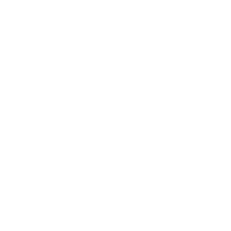

In [100]:
fig = plt.figure()
camera = Camera(fig)  # create the camera object from celluloid

for i in range(0, len(scan), 2):  # Sagital view. Skip every second slice to reduce the video length
    plt.imshow(scan[i], cmap="bone")
    mask = np.ma.masked_where(segmentation[i]==0, segmentation[i])
    plt.imshow(mask, alpha=0.5, cmap="autumn")  # Use autumn colormap to get red segmentation 
    
    plt.axis("off")
    camera.snap()  # Store the current slice
animation = camera.animate()  # create the animation

/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.8/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.8/dist-packages/matplotlib/colors.py:993: UserWarning: Warning: converting a masked element to nan.
  data = np.asarray(value)


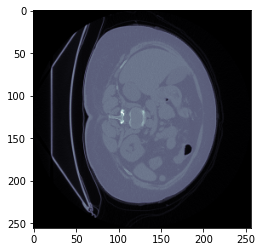

In [94]:
i=1
plt.imshow(scan[i], cmap="bone")
mask = np.ma.masked_where(segmentation[i]==0, segmentation[0])
plt.imshow(mask, alpha=0.5, cmap="autumn")